In [1]:
###### import packages for analysis
import scanpy as sc
import pandas as pd
import numpy as np
import os
from matplotlib import rcParams
import seaborn as sb
import matplotlib.pyplot as plt
import anndata 
from scipy import sparse
from anndata import AnnData
import time
import MACA as maca          

In [2]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')

scanpy==1.9.1 anndata==0.8.0 umap==0.5.3 numpy==1.20.3 scipy==1.10.0 pandas==1.5.2 scikit-learn==1.1.3 statsmodels==0.13.5 python-igraph==0.10.2 louvain==0.8.0 pynndescent==0.5.6


In [3]:
# the file that will store the analysis results
#results_file = '/home/mmokhtari/INF_analysis/INF_analysis.h5ad' 

In [4]:
#reading the donor_ids
donor = pd.read_csv('/home/mmokhtari/INF_analysis/donor_ids.tsv',sep="\t")
#setting the cell_barcode as the denor_ids index
donor.set_index('cell',inplace=True)

In [5]:
donor = donor.replace("doublet","genetic_doublet")

In [6]:
#reading the raw_feature_bc_matrix
adata = sc.read_10x_h5('/home/mmokhtari/INF_analysis/raw_feature_bc_matrix.h5')

reading /home/mmokhtari/INF_analysis/raw_feature_bc_matrix.h5
 (0:00:03)


In [7]:
#assigning the donor_ids to adata.obs
adata.obs["donor"] = donor["donor_id"]

In [8]:
#filtering out the nans, unassigned droplets and doublets.
adata = adata[~adata.obs["donor"].isna()]
adata = adata[adata.obs["donor"] != "unassigned"]
#adata = adata[adata.obs["donor"] != "genetic_doublet"]

In [9]:
adata = adata.copy()

In [10]:
adata.var_names_make_unique()

normalizing counts per cell
    finished (0:00:00)


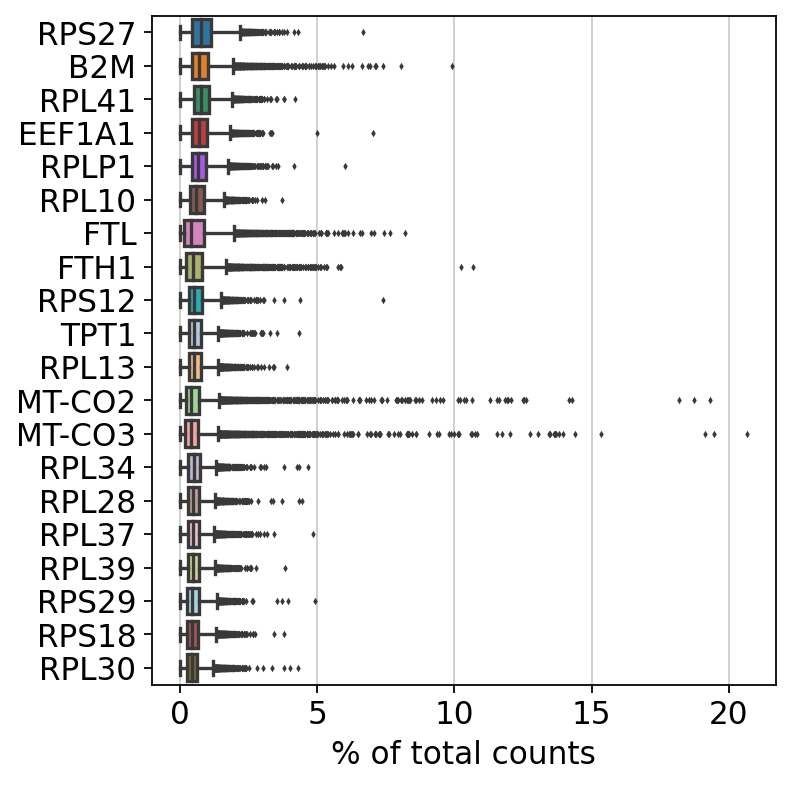

In [11]:
#genes with highest fraction of counts
sc.pl.highest_expr_genes(adata, n_top=20, )

In [12]:
#filtering the cells with low unique gene number and genes expressed in few cells
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)

filtered out 631 cells that have less than 200 genes expressed
filtered out 3751 genes that are detected in less than 3 cells


In [13]:
# annotate the group of mitochondrial genes as 'mt'
adata.var['mt'] = adata.var_names.str.startswith('MT-')  
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

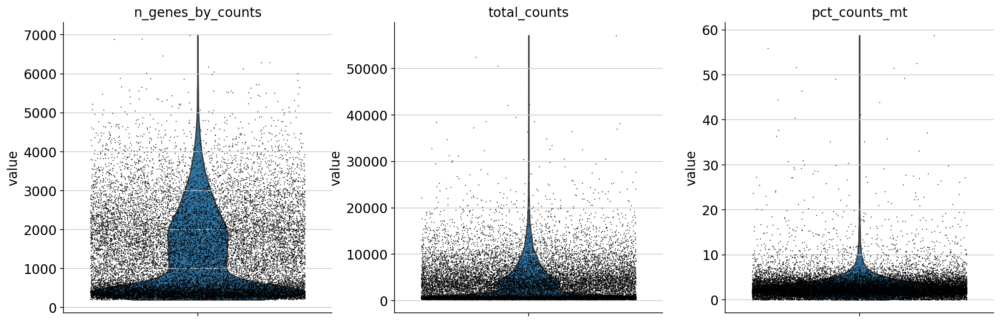

In [14]:
#A violin plot of some of the computed quality measures
adata.var_names_make_unique()
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

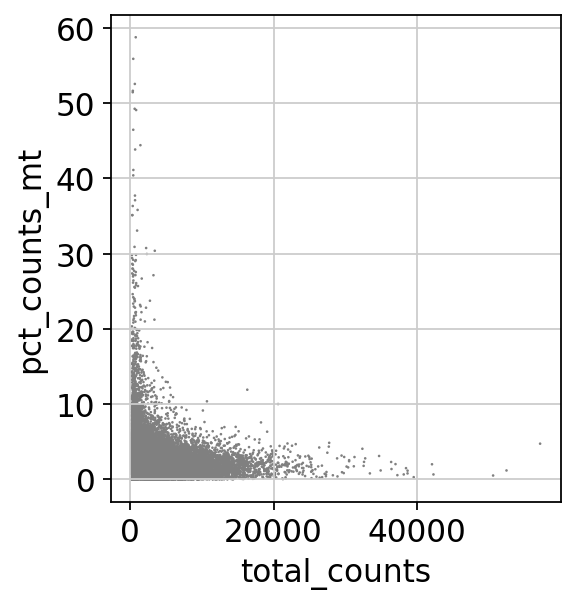

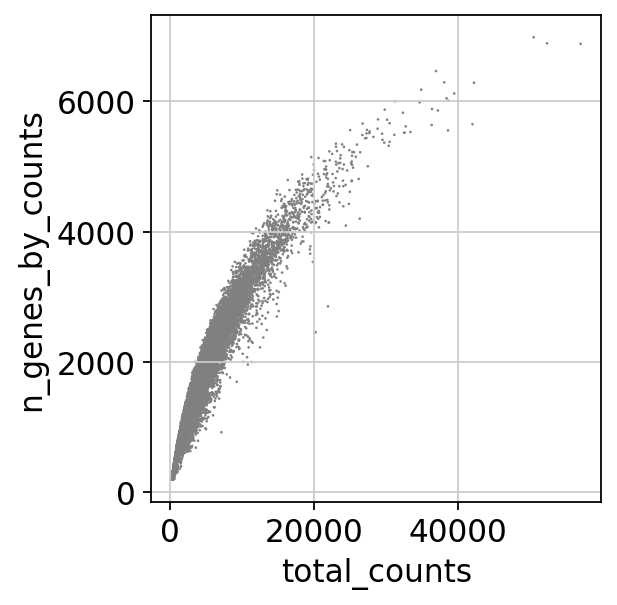

In [15]:
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

In [16]:
#filtering for mts and n_genes_by_counts
adata = adata[adata.obs.n_genes_by_counts < 4000, :]
adata = adata[adata.obs.pct_counts_mt < 5, :]

In [17]:
adata = adata.copy()

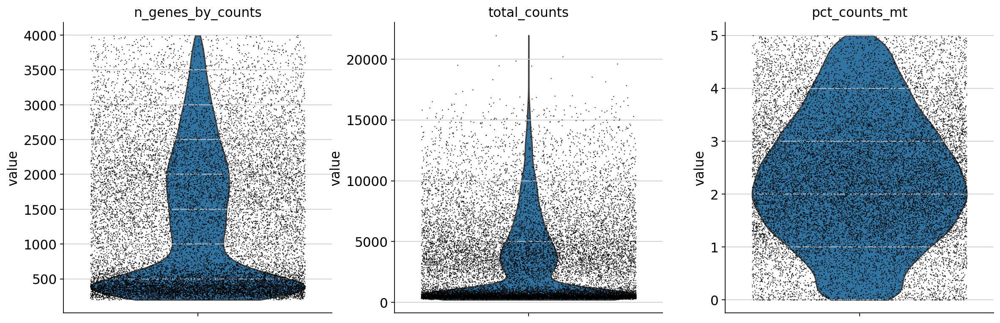

In [18]:
#A violin plot of some of the computed quality measures after filtering for mt and n_genes_by_ncounts
adata.var_names_make_unique()
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

In [19]:
#count normalizing the data
sc.pp.normalize_total(adata, target_sum=1e4)

normalizing counts per cell
    finished (0:00:00)


In [20]:
#logaritmazing the data
sc.pp.log1p(adata)

extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


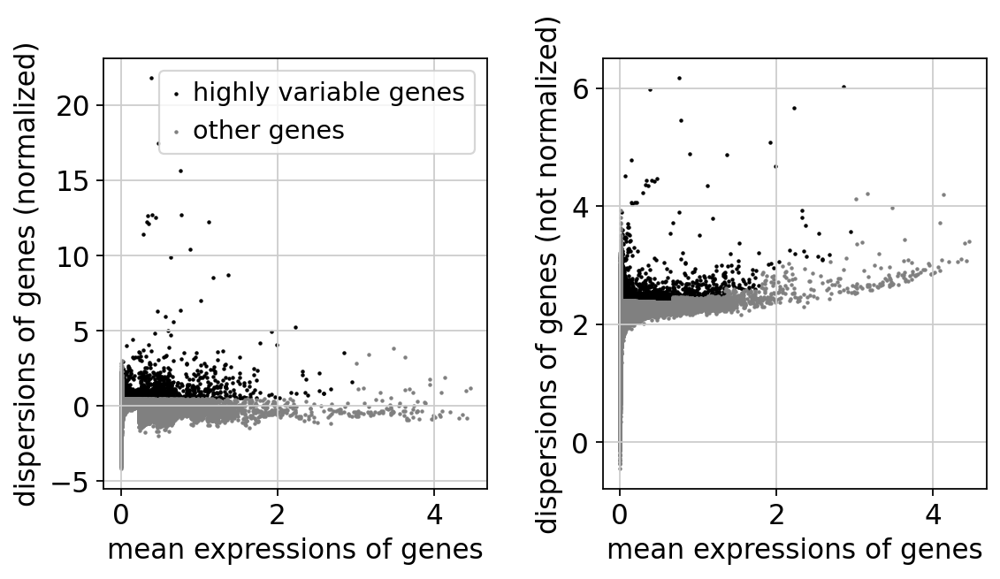

In [21]:
#Identify highly-variable genes
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pl.highly_variable_genes(adata)

normalizing counts per cell
    finished (0:00:00)


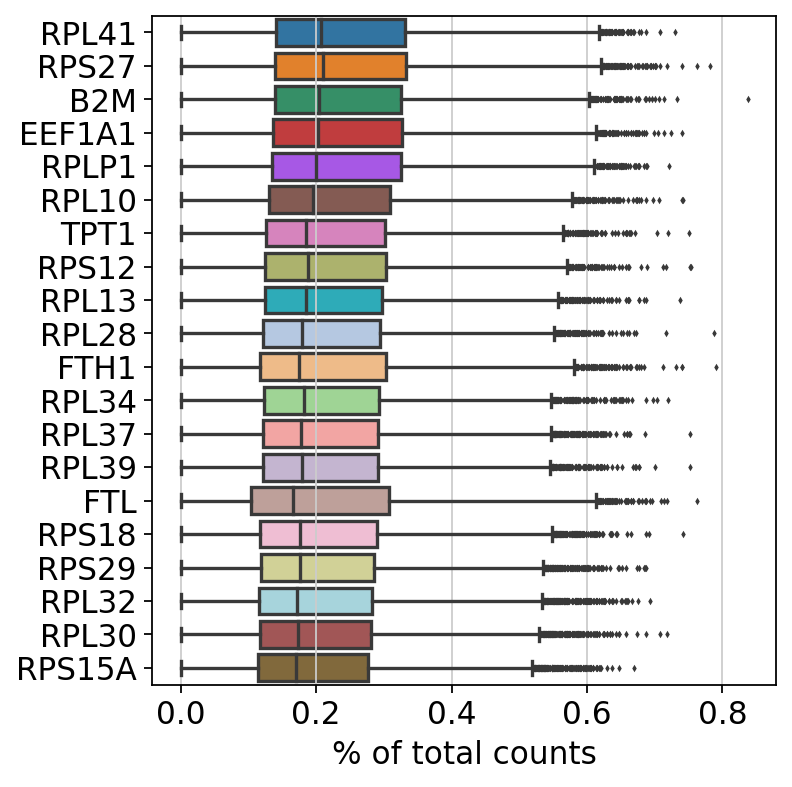

In [22]:
#highest expressed genes
sc.pl.highest_expr_genes(adata, n_top=20, )

In [23]:
adata.raw = adata


In [24]:
adata = adata[:, adata.var.highly_variable]


In [25]:
adata = adata.copy()

In [26]:
#Regress out effects of total counts per cell and the percentage of mitochondrial genes expressed. Scale the data to unit variance.
#sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])


In [27]:
#Scale each gene to unit variance
sc.pp.scale(adata, max_value=10)

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


In [28]:
#running PCA
sc.tl.pca(adata, svd_solver='arpack')


computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:05)


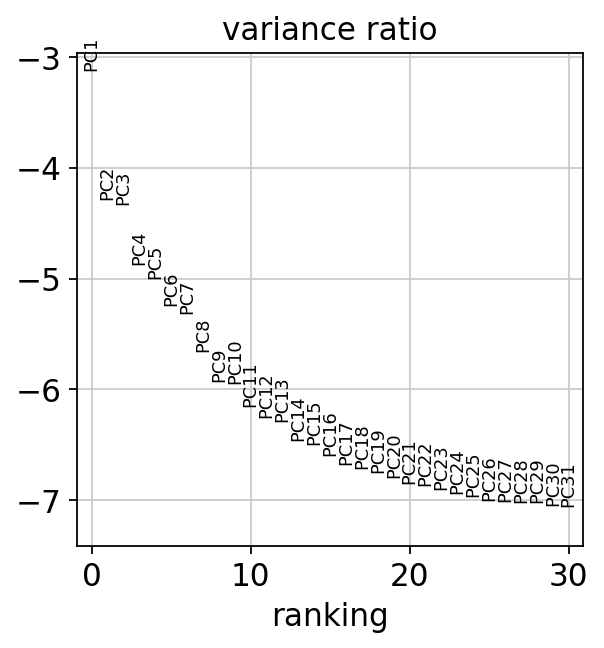

In [29]:
sc.pl.pca_variance_ratio(adata, log=True)


In [30]:
#adata.write(results_file)


In [31]:
adata


AnnData object with n_obs × n_vars = 18782 × 2422
    obs: 'donor', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'

In [32]:
#Computing the neighborhood graph
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)


computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:06:14)


computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:17)


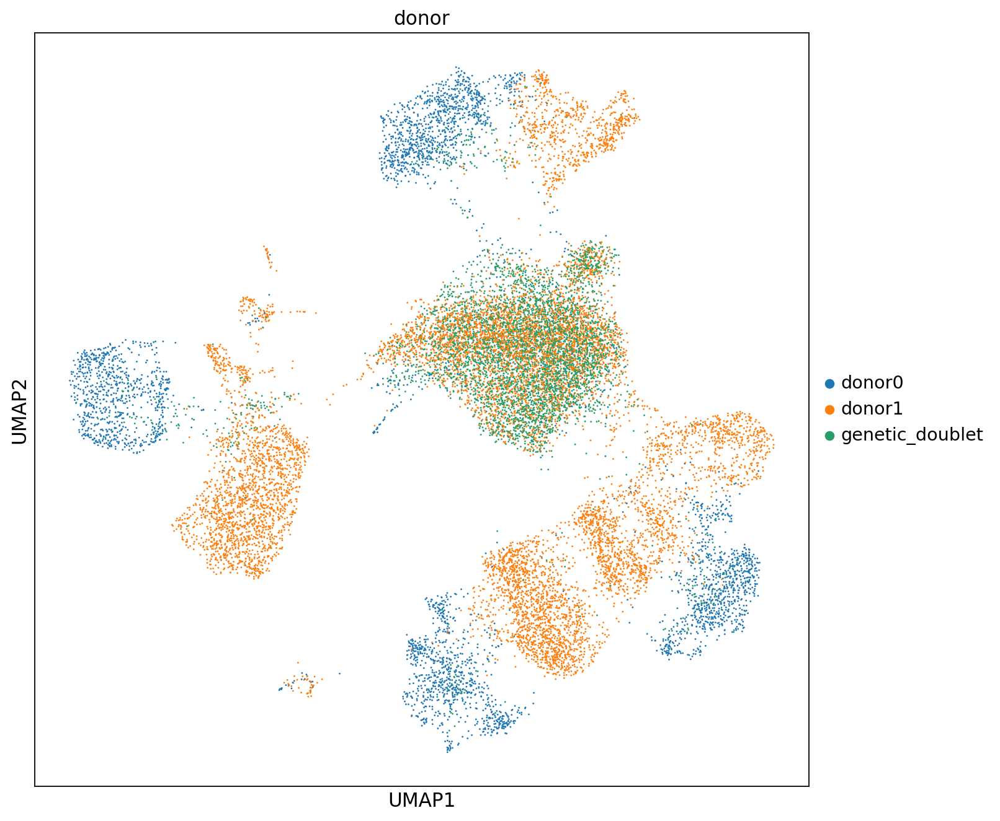

In [33]:
#Visualize with umaps
rcParams['figure.figsize']=(10,10)
sc.tl.umap(adata)
sc.pl.umap(adata, color='donor')


In [34]:
sc.tl.leiden(adata)

running Leiden clustering
    finished: found 18 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:01)


In [35]:
# Perform clustering - using highly variable genes
sc.tl.louvain(adata, key_added='louvain_r1.2',resolution=1.2)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 19 clusters and added
    'louvain_r1.2', the cluster labels (adata.obs, categorical) (0:00:01)


<Figure size 800x800 with 0 Axes>

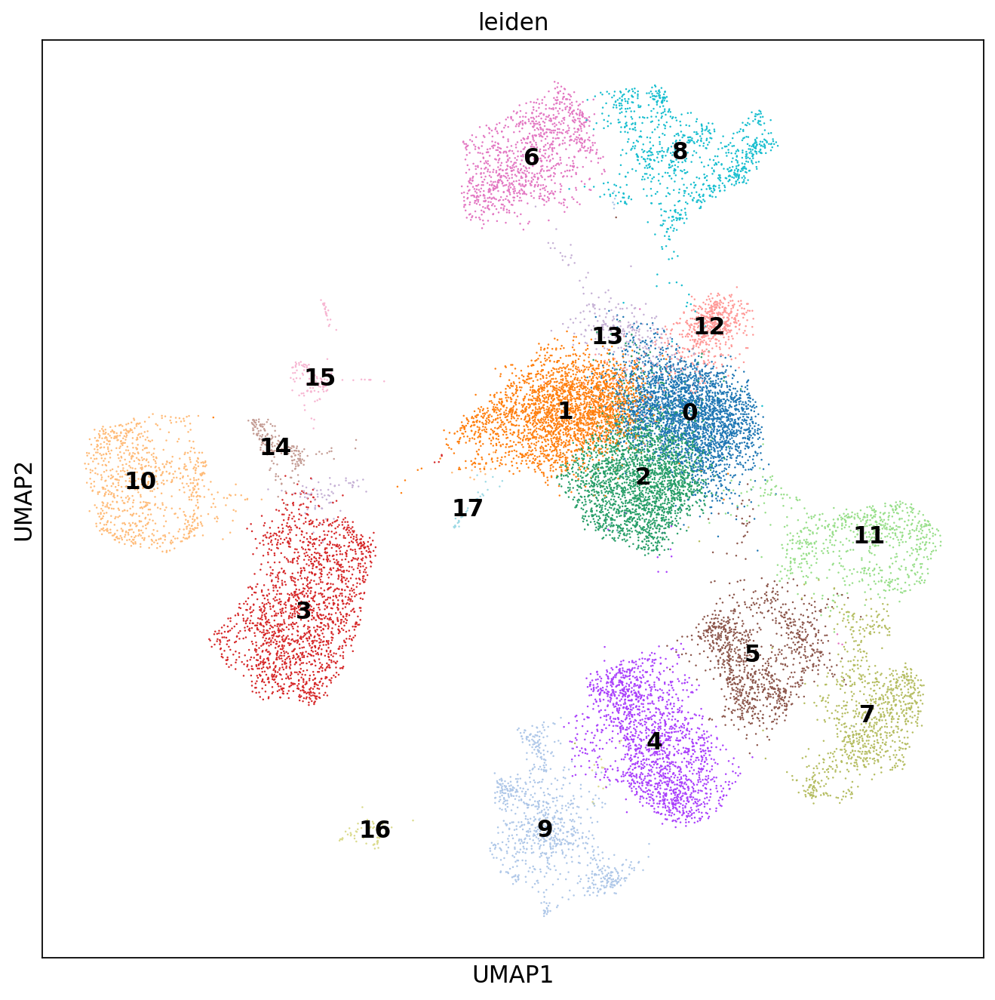

In [36]:
#Visualize the clusters with umap 
rcParams['figure.figsize']=(10,10)
fig_ind=np.arange(131, 133)
fig = plt.figure()
fig.subplots_adjust(hspace=0.4, wspace=0.6)

sc.pl.umap(adata, color=['leiden'],  legend_loc='on data',edgecolor='none', size=5, show=True, linewidths=10)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:45)


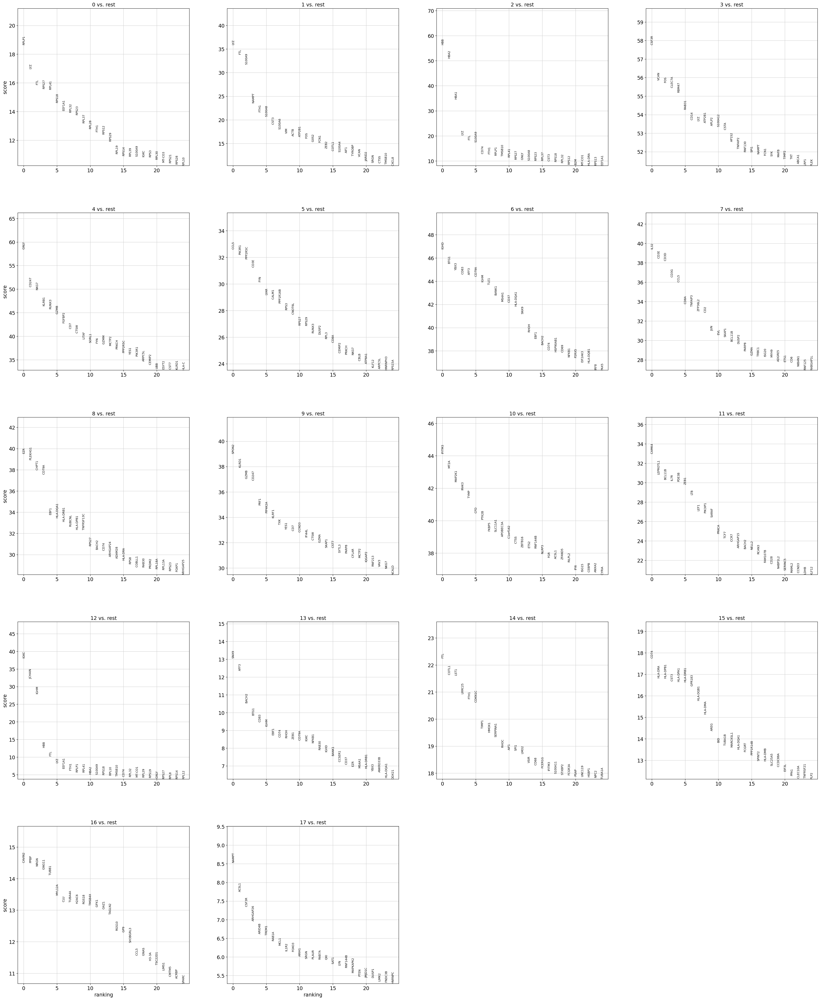

In [37]:
sc.tl.rank_genes_groups(adata, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

In [38]:
##load all packages
#import anndata
#import collections
#import numpy as np
#import pandas as pd
#import scanpy as sc
#import MACA as maca

#import warnings
#warnings.filterwarnings("ignore")

In [39]:
#Try MACA with the the MACA markers
pg_df = pd.read_table('/home/mmokhtari/INF_analysis/PanglaoDB_markers_27_Mar_2020 (2).tsv.gz')

In [40]:
##remove mouse specific genes
pg_df = pg_df[pg_df['species']!='Mm']
cell_markers = {}##cell_marker is dictionary that contains names of cell types and their marker genes
marker_list = []
for i in list(set(pg_df["cell type"].values.tolist())):
    genes = pg_df[pg_df["cell type"]==i]['official gene symbol'].values.tolist()
    ##only use cell type with at least 5 genes and less than 300 genes
    if len(genes)>=5 and len(genes)<=300:
        cell_markers[i]=genes
        marker_list+= genes
marker_list = list(set(marker_list))
marker_list = [i for i in marker_list if i in adata.var.index]
len(marker_list)

786

In [41]:
np.version.version


'1.20.3'

In [42]:
ad = adata.copy()
ad = ad[:,marker_list]

##run MACA
ad, annotation = maca.singleMACA(ad=ad, cell_markers=cell_markers,
                                 res=[1,1.5,2],n_neis=[3,5,10])
##we define louvain clustering resolution 1, 1.5 and 2; 
##number of neighbors to define the kNN is 3,5 and 10 separately.
##MACA will get 9 clustering results, using this set of parameteres.
##The final annotation is ensembled via voting.

(18782, 94)
(18782, 94)
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 33 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:00)
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 17 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:02)
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
running Louvain clusterin

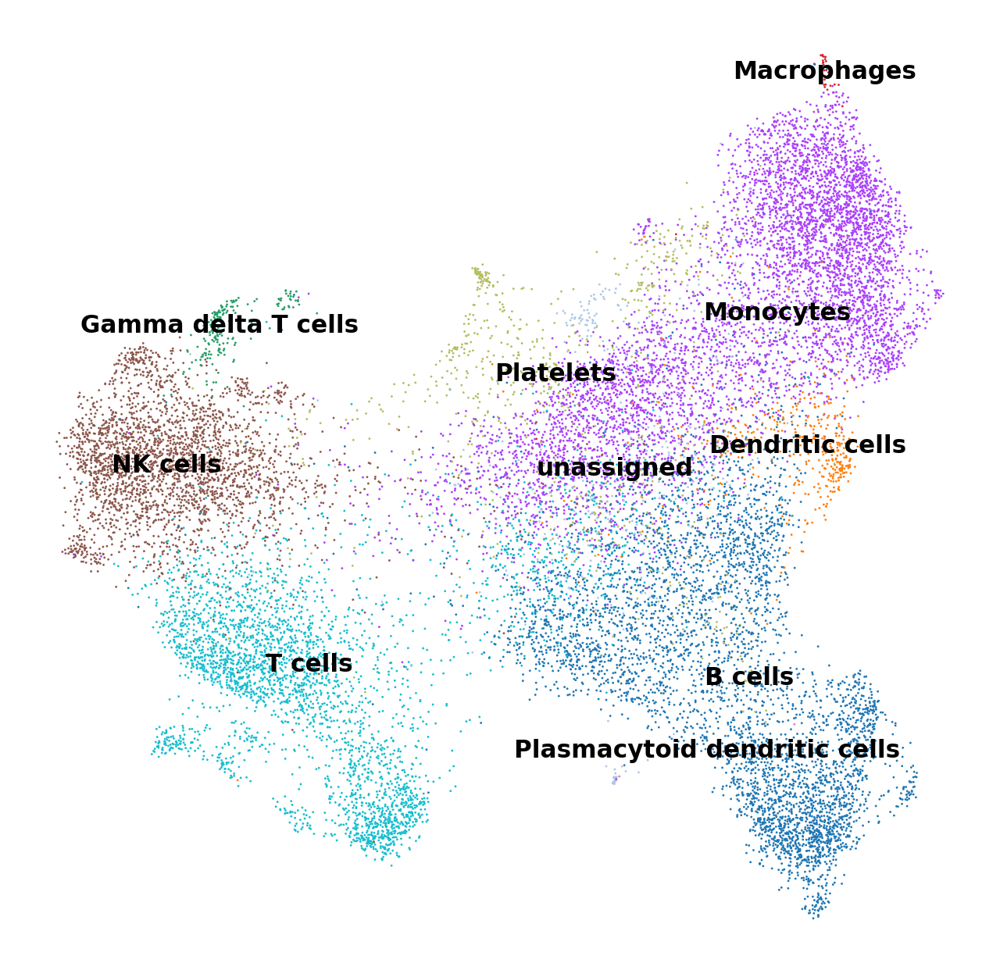

In [43]:
##visualization
ad.obs['Annotation']=np.array(annotation)
sc.pl.umap(ad, color='Annotation', legend_loc='on data', title='', frameon=False)

In [44]:
#Try maca with azimuth df
azimuth_markers = pd.read_excel('/home/mmokhtari/INF_analysis/Azimuth_Markers.xlsx')
cols = azimuth_markers['Markers'].str.split(',', expand = True)
azimuth_markers.drop(['Markers', 'Label', 'OBO Ontology ID'], inplace=True, axis=1)
azimuth_markers = pd.concat([azimuth_markers, cols], axis = 1)


In [45]:
#Create lists required for creating MACA dictionary for annotation
cells_of_interest_az = azimuth_markers['Expanded Label'].values.tolist()

In [46]:
azimuth_markers.loc[:,0:9] = azimuth_markers.loc[:,0:9].astype(str)

In [47]:
#strip spaces in columns 1:9 because from the second element in the values in dictionary created, there were spaces
for i in range(0,10):
    azimuth_markers[i] = azimuth_markers[i].str.strip()


In [48]:
#check is spaces have been stripped
azimuth_markers[azimuth_markers[0].str.count(' ') == 1]

,Expanded Label,0,1,2,3,4,5,6,7,8,9


In [49]:
cell_markers_az = {}
marker_list_az = []
for i,j in zip(range(0,93),cells_of_interest_az):
    x = azimuth_markers.iloc[i,:].values.tolist()
    cell_markers_az[j] = x[:]
    marker_list_az += x[1:]

In [50]:
#Select unique markers
marker_list_az = list(set(marker_list_az))
len(marker_list_az)

215

In [51]:
#Make copy of adata with genes present in the marker_list list to run MACA
ad_az = adata.copy()
#ad_az = ad_az[:,marker_list_az].copy()


In [52]:
#Run MACA for cluster annotation
start_time = time.time()
ad_az, annotation_az = maca.singleMACA(ad=ad_az, cell_markers=cell_markers_az,res=[1, 1, 1],n_neis=[3,5,10])
print("--- %s mins ---" % int((time.time() - start_time)/60))

(18782, 23)
(18782, 23)
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 122 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:00)
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 36 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:00)
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
running Louvain clusteri

In [53]:
#Add annotation column to the copied adata
ad_az.obs['Annotation']=np.array(annotation_az)

In [54]:
#Add annotation column from the copied adata to the original adata
adata.obs['Ann_az_default'] = ad_az.obs.Annotation

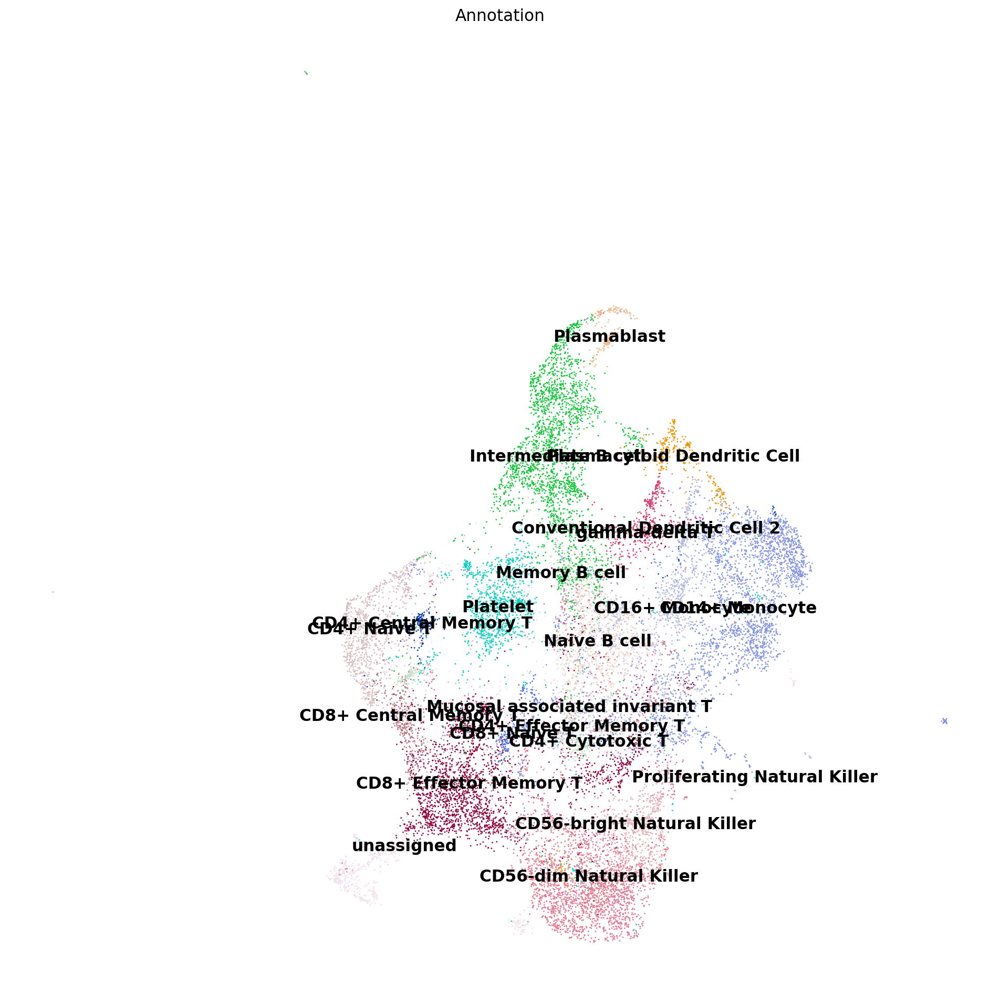

In [55]:
#Visualization of the cluster annotation by MACA
rcParams['figure.figsize']=(15,15)

sc.pl.umap(ad_az, color='Annotation' , legend_loc='on data', frameon=False)

In [56]:
ad_az

AnnData object with n_obs × n_vars = 18782 × 2422
    obs: 'donor', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'louvain_r1.2', 'Label1', 'louvain', 'Mapped', 'Annotation'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'donor_colors', 'leiden', 'louvain', 'leiden_colors', 'rank_genes_groups', 'Annotation_colors'
    obsm: 'X_pca', 'X_umap', 'Score'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [57]:
adata.obs["annotation_AZ"] = ad_az.obs["Annotation"]

<Figure size 800x800 with 0 Axes>

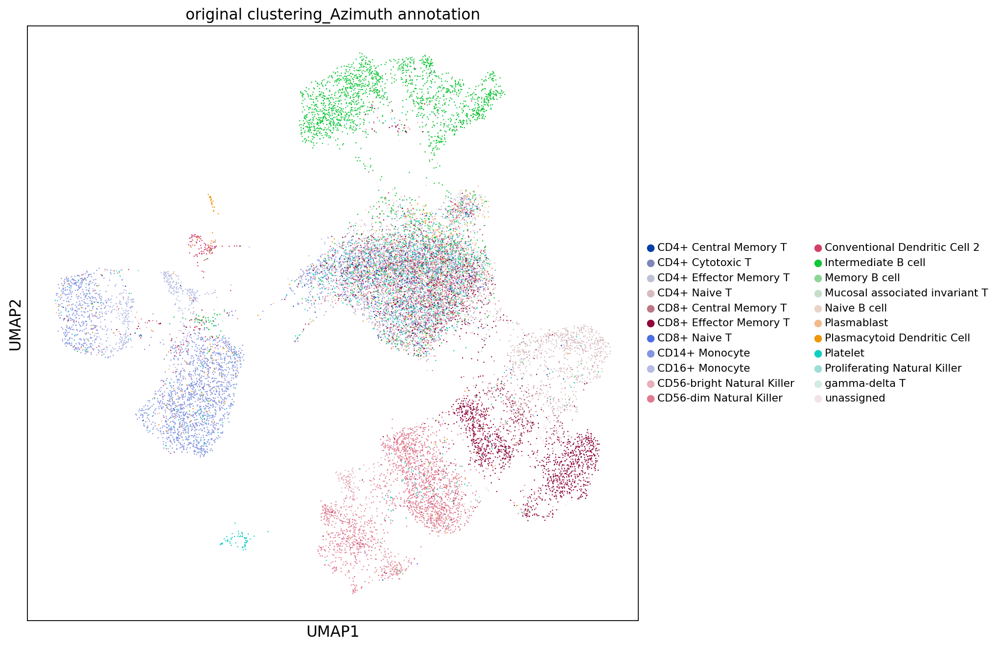

In [58]:
#Visualize the clusters with umap
#original clustering_Azimuth annotation
rcParams['figure.figsize']=(10,10)
fig_ind=np.arange(131, 133)
fig = plt.figure()
fig.subplots_adjust(hspace=0.4, wspace=0.6)

sc.pl.umap(adata, color=["annotation_AZ"],edgecolor='none', size=5,legend_fontsize = "x-small", show=True, linewidths=10, title="original clustering_Azimuth annotation")

<Figure size 800x800 with 0 Axes>

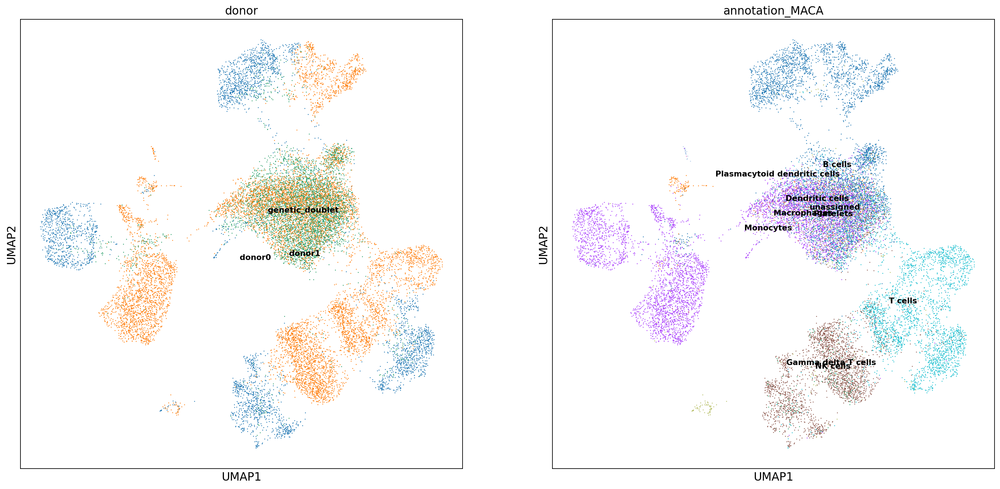

In [59]:
#original clustering_MACA annotation
adata.obs["annotation_MACA"] = ad.obs["Annotation"]
#Visualize the clusters with umap 
rcParams['figure.figsize']=(10,10)
fig_ind=np.arange(131, 133)
fig = plt.figure()
fig.subplots_adjust(hspace=0.4, wspace=0.6)

sc.pl.umap(adata, color=["donor","annotation_MACA"], legend_loc='on data',edgecolor='none', size=5, show=True, linewidths=10,legend_fontsize = "x-small")

<Figure size 800x800 with 0 Axes>

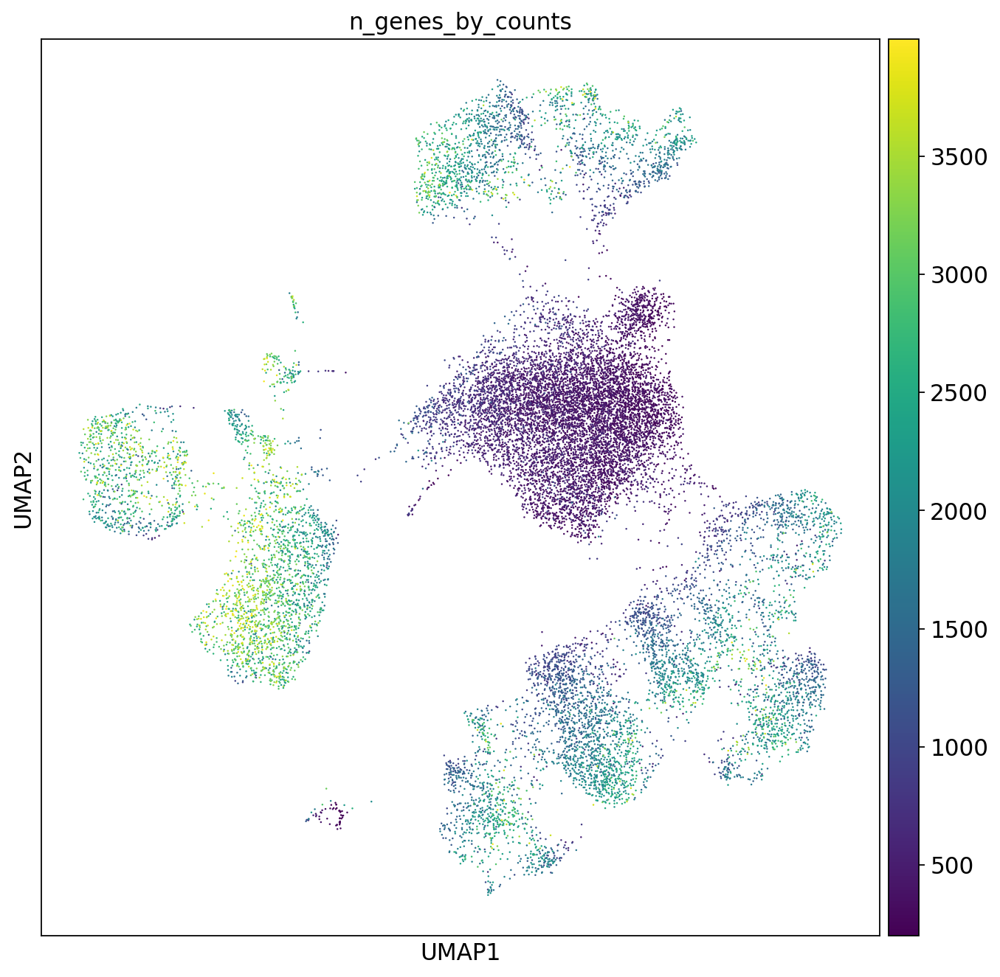

In [60]:

#Visualize the clusters with umap 
rcParams['figure.figsize']=(10,10)
fig_ind=np.arange(131, 133)
fig = plt.figure()
fig.subplots_adjust(hspace=0.4, wspace=0.6)

sc.pl.umap(adata, color=["n_genes_by_counts"], legend_loc='on data',edgecolor='none', size=5, show=True, linewidths=10, title="n_genes_by_counts")

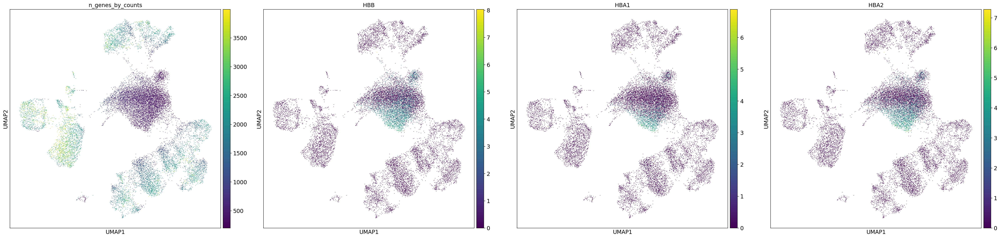

In [61]:
#by gene
#Visualize the clusters with umap 
#rcParams['figure.figsize']=(10,10)
#fig_ind=np.arange(131, 133)
#fig = plt.figure()
#fig.subplots_adjust(hspace=0.4, wspace=0.6)

sc.pl.umap(adata, color=["n_genes_by_counts","HBB","HBA1","HBA2"],edgecolor='none', size=5, show=True, linewidths=10,legend_fontsize = "x-small", title=["n_genes_by_counts","HBB"],save="HBs.png")


In [62]:
#by gene
#Visualize the clusters with umap 
#rcParams['figure.figsize']=(10,10)
#fig_ind=np.arange(131, 133)
#fig = plt.figure()
#fig.subplots_adjust(hspace=0.4, wspace=0.6)

#sc.pl.umap(adata, color=["n_genes_by_counts","S100A9","CTSS","S100A8","VCAN"],edgecolor='none', size=5, show=True, linewidths=10,legend_fontsize = "x-small", title=["n_genes_by_counts"],save="CD14s.png")


In [63]:
#adata.write(results_file, compression='gzip')

In [64]:
doublets = pd.read_csv('/home/mmokhtari/INF_analysis/doublets.tsv',sep="\t")


In [65]:
adata.obs["doublets"] = doublets["DF.classifications_0.25_0.005_1405"]
####
adata.obs["doublets_score"] = doublets["pANN_0.25_0.005_1405"]

<Figure size 800x800 with 0 Axes>

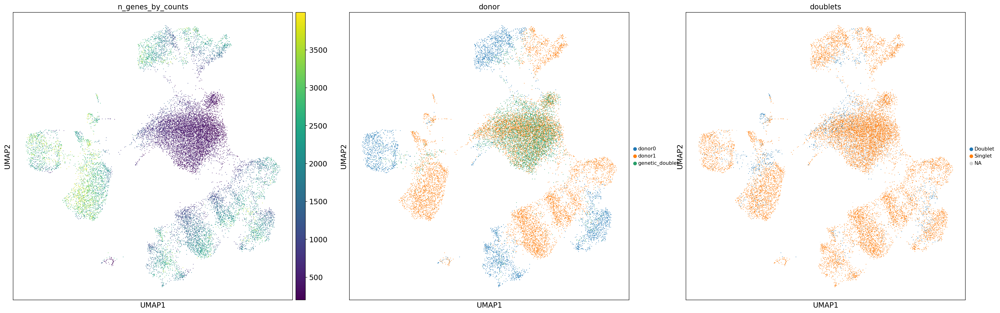

In [66]:
#by doublets
#Visualize the clusters with umap 
rcParams['figure.figsize']=(10,10)
fig_ind=np.arange(131, 133)
fig = plt.figure()
fig.subplots_adjust(hspace=0.4, wspace=0.6)
sc.pl.umap(adata, color=["n_genes_by_counts","donor","doublets"],edgecolor='none', size=5, show=True, linewidths=10,legend_fontsize = "x-small",save="doublets.png")

In [67]:
adata_doublet_pDC = adata[(adata.obs['doublets']=="Doublet") & (adata.obs['doublets_score']<0.40) & (adata.obs['annotation_AZ']=="Plasmacytoid Dendritic Cell")]

In [68]:
adata_doublet_pDC.obs.leiden.dtype

CategoricalDtype(categories=['1', '2', '5', '7', '9', '15'], ordered=False)

In [69]:
adata_doublet_pDC.obs.insert(13, 'indicator', range(1, 1 + len(adata_doublet_pDC.obs)))
adata_doublet_pDC.obs["indicator"]=pd.Categorical(adata_doublet_pDC.obs.indicator)

In [ ]:
#donor
#Visualize the clusters with umap 
rcParams['figure.figsize']=(10,10)
fig_ind=np.arange(131, 133)
fig = plt.figure()
fig.subplots_adjust(hspace=0.4, wspace=0.6)

sc.pl.umap(adata_doublet_pDC, color=["indicator","donor","n_genes_by_counts","leiden",'CAMK4','IL7R','BCL11B', 'LTB','FOXP3','IL7R','NELL2','CD8A','CCL5','CD3E','RFX7','AKAP9','FYN',
              'IKZF2','GNLY', 'MCTP2','XCL2', 'CD247','GZMB','NCR3','KLRB1','ARAP2','KLRC1',
                'IGHM','CD79A','CD74','EZR','CD79A','TNFRSF13C','CST3','HLA-DRA','HLA-DPA1','LYZ','S100A9', 'S100A8','CD14',
                'LST1', 'AIF1','IFITM3','FCGR3A','PPBP','NRGN','GNG11',"LRRC26","TPM2","ASIP","KRT5","GPM6B","SHD","NTM","SCT",
                "KCNA5","SCARA5","EPHA2","IL3RA","HLA-DRA","CLEC4C","NRP1","PTPRC","ITM2C", "PLD4", "SERPINF1", "LILRA4", "IL3RA", "TPM2",
                                       "MZB1", "SPIB", "IRF4", "SMPD3","IL12A","ZEB2","TCF4","IRF4","IRF8"],edgecolor='none', size=60, show=True, linewidths=10,legend_fontsize = "x-small")

In [71]:
marker_genes_dict_final = {
    'CD4+_T':['CAMK4','IL7R','BCL11B', 'LTB','FOXP3'],
    'CD8+_T':['IL7R','NELL2','CD8A','CCL5','CD3E','RFX7','AKAP9','FYN',
              'IKZF2'],
    'NK':['GNLY', 'MCTP2','XCL2', 'CD247','GZMB','NCR3','KLRB1','ARAP2','KLRC1'],
    'B':['IGHM','CD79A','CD74','EZR','CD79A','TNFRSF13C'],
    'cDC':['CST3','HLA-DRA','HLA-DPA1'],
    'CD14+_Monocyte': ['LYZ','S100A9', 'S100A8','CD14'],#
    'CD16+_Monocyte': ['LST1', 'AIF1','IFITM3','FCGR3A'],#
    'Platelet': ['PPBP','NRGN','GNG11'],#
}
marker_genes = ['CAMK4','IL7R','BCL11B', 'LTB','FOXP3','IL7R','NELL2','CD8A','CCL5','CD3E','RFX7','AKAP9','FYN',
              'IKZF2','GNLY', 'MCTP2','XCL2', 'CD247','GZMB','NCR3','KLRB1','ARAP2','KLRC1',
                'IGHM','CD79A','CD74','EZR','CD79A','TNFRSF13C','CST3','HLA-DRA','HLA-DPA1','LYZ','S100A9', 'S100A8','CD14',
                'LST1', 'AIF1','IFITM3','FCGR3A','PPBP','NRGN','GNG11',"LRRC26","TPM2","ASIP","KRT5","GPM6B","SHD","NTM","SCT",
                "KCNA5","SCARA5","EPHA2","IL3RA","HLA-DRA","CLEC4C","NRP1","PTPRC","ITM2C", "PLD4", "SERPINF1", "LILRA4", "IL3RA", "TPM2",
                                       "MZB1", "SPIB", "IRF4", "SMPD3","IL12A","ZEB2","TCF4","IRF4","IRF8"]

{'mainplot_ax': <AxesSubplot:>,
 'color_legend_ax': <AxesSubplot:title={'center':'Median expression\nin group'}>}

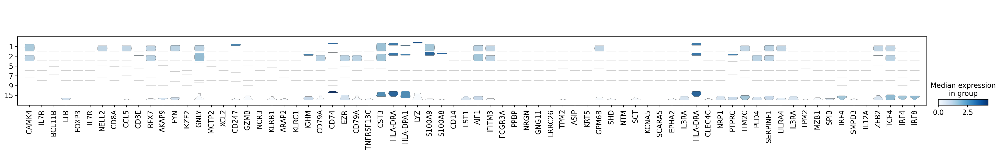

In [72]:

sc.pl.stacked_violin(adata_doublet_pDC, marker_genes, groupby='leiden',use_raw=True, show=False)


In [99]:
adata_doublet_pDC_cluster_16 = adata_doublet_pDC[(adata_doublet_pDC.obs['leiden']=="15")]

,donor,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,leiden,louvain_r1.2,Ann_az_default,annotation_AZ,annotation_MACA,doublets,doublets_score,indicator
ACTGTCCAGTGGAATT-1,donor1,2230,2230,4979.0,64.0,1.285399,15,15,Plasmacytoid Dendritic Cell,Plasmacytoid Dendritic Cell,unassigned,Doublet,0.393162,1
ATGGGAGTCTCAACGA-1,donor1,2329,2328,6750.0,67.0,0.992593,15,15,Plasmacytoid Dendritic Cell,Plasmacytoid Dendritic Cell,unassigned,Doublet,0.376068,3
GTCCTCAGTATCCCAA-1,donor1,2738,2736,9355.0,122.0,1.304115,15,15,Plasmacytoid Dendritic Cell,Plasmacytoid Dendritic Cell,Plasmacytoid dendritic cells,Doublet,0.384615,7
TAGAGTCCACTGATTG-1,donor1,3075,3075,15090.0,297.0,1.968191,15,15,Plasmacytoid Dendritic Cell,Plasmacytoid Dendritic Cell,Dendritic cells,Doublet,0.367521,10
TGCTTCGGTCGGTGAA-1,donor1,2783,2783,15077.0,471.0,3.123964,15,15,Plasmacytoid Dendritic Cell,Plasmacytoid Dendritic Cell,Dendritic cells,Doublet,0.384615,11


In [100]:
################################################################################################################################################

<Figure size 800x800 with 0 Axes>

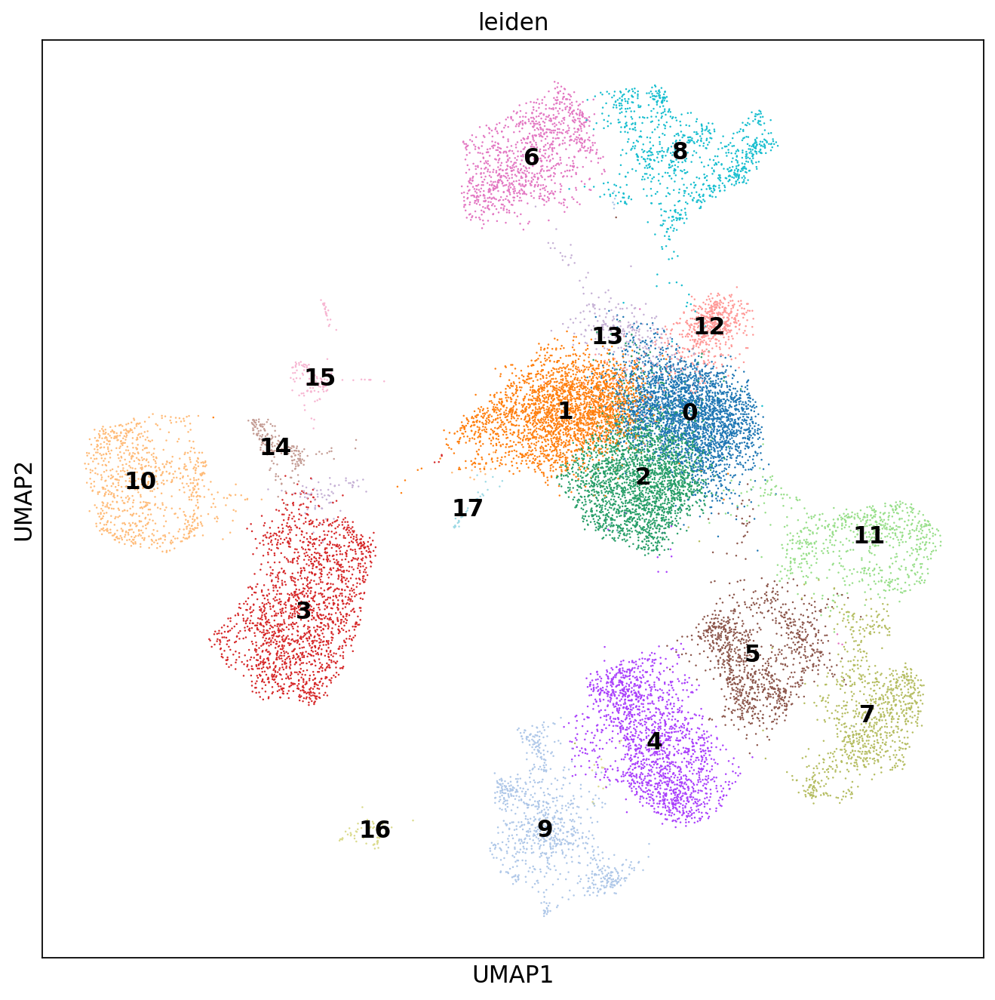

In [101]:

#Visualize the clusters with umap 
rcParams['figure.figsize']=(10,10)
fig_ind=np.arange(131, 133)
fig = plt.figure()
fig.subplots_adjust(hspace=0.4, wspace=0.6)

sc.pl.umap(adata, color=["leiden"], legend_loc='on data',edgecolor='none', size=5, show=True, linewidths=10, title="leiden")

In [102]:
###### filtering out the genetic doublets, heterotypic doublets, lowly expressed clusters
adata_filtered = adata[adata.obs["donor"] != "genetic_doublet"]
adata_filtered = adata_filtered[adata_filtered.obs["doublets"] != "Doublet"]
adata_filtered_pDC_primary = adata_filtered[adata_filtered.obs["Ann_az_default"] == "Plasmacytoid Dendritic Cell"]
adata_filtered_pDC_primary = adata_filtered_pDC_primary[(adata_filtered_pDC_primary.obs["leiden"] == "0") | (adata_filtered_pDC_primary.obs["leiden"] =="1")|(adata_filtered_pDC_primary.obs["leiden"] =="2")|(adata_filtered_pDC_primary.obs["leiden"] =="12")|(adata_filtered_pDC_primary.obs["leiden"] =="13")]
adata_filtered = adata_filtered[adata_filtered.obs["leiden"] != "0"]
adata_filtered = adata_filtered[adata_filtered.obs["leiden"] != "1"]
adata_filtered = adata_filtered[adata_filtered.obs["leiden"] != "2"]
adata_filtered = adata_filtered[adata_filtered.obs["leiden"] != "12"]
adata_filtered = adata_filtered[adata_filtered.obs["leiden"] != "13"]
newlist = [adata_filtered, adata_filtered_pDC_primary]
adata_filtered = anndata.concat(newlist)


In [103]:
barcodses = [adata_filtered.obs.index]

In [105]:
##############################################################################################################################################################################

<Figure size 800x800 with 0 Axes>

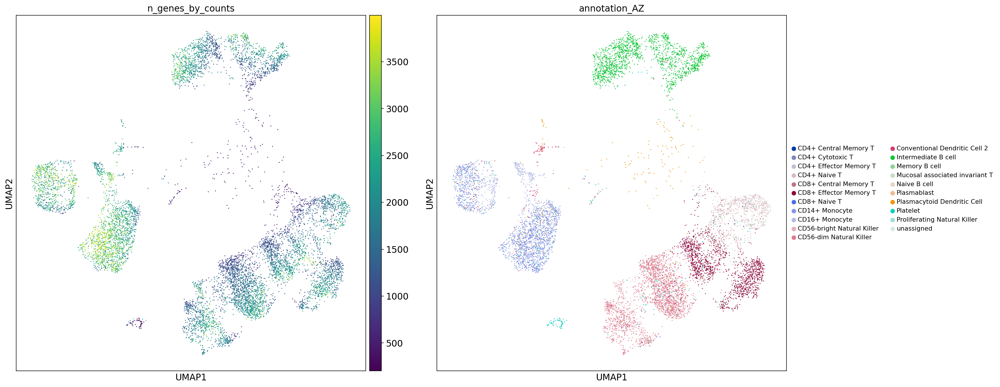

In [106]:
###### donor
#adata_filtered.obs["annotation_MACA"] = ad.obs["Annotation"]
#Visualize the clusters with umap 
rcParams['figure.figsize']=(10,10)
fig_ind=np.arange(131, 133)
fig = plt.figure()
fig.subplots_adjust(hspace=0.4, wspace=0.6)

sc.pl.umap(adata_filtered, color=["n_genes_by_counts","annotation_AZ"],edgecolor='none', size=8, show=True, linewidths=10,legend_fontsize = "x-small",save="cluster annotation.png")

###### 

<Figure size 800x800 with 0 Axes>

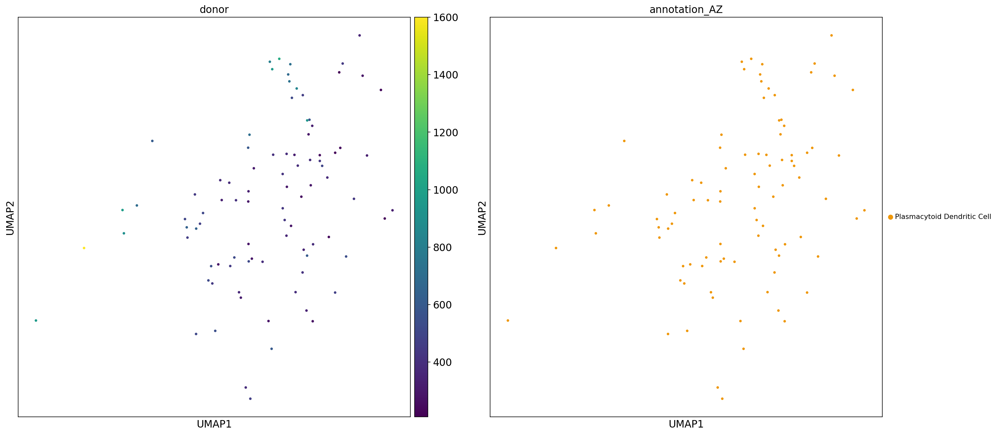

In [107]:
adata_pDC = adata_filtered[adata_filtered.obs["annotation_AZ"] == "Plasmacytoid Dendritic Cell"]
adata_pDC.obs
#donor
#Visualize the clusters with umap 
rcParams['figure.figsize']=(10,10)
fig_ind=np.arange(131, 133)
fig = plt.figure()
fig.subplots_adjust(hspace=0.4, wspace=0.6)

sc.pl.umap(adata_filtered_pDC_primary, color=["n_genes_by_counts","annotation_AZ"],edgecolor='none', size=50, show=True, linewidths=10,legend_fontsize = "x-small", title="donor",save="cluster annotation.png")

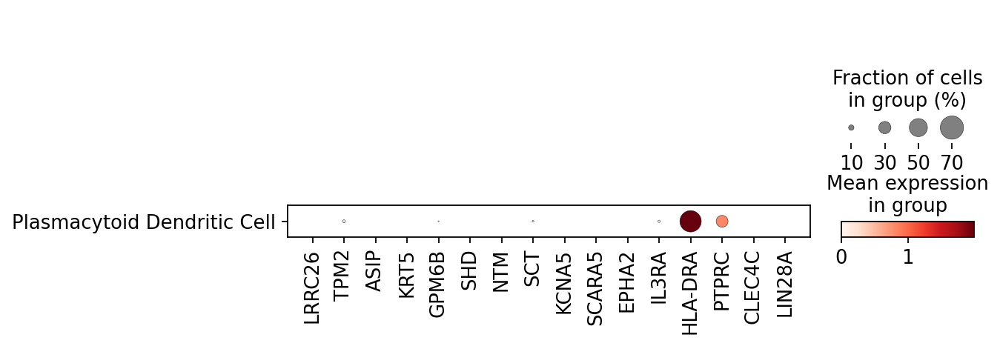

In [108]:
pDC_markers = ["LRRC26","TPM2","ASIP","KRT5","GPM6B","SHD","NTM","SCT","KCNA5","SCARA5","EPHA2","IL3RA","HLA-DRA","PTPRC","CLEC4C","LIN28A"]

sc.pl.dotplot(adata_filtered_pDC_primary,pDC_markers, groupby='annotation_AZ',dendrogram=False, use_raw=True)

In [109]:
print(len(adata_filtered[(adata_filtered.obs["annotation_AZ"]=="Plasmacytoid Dendritic Cell")&(adata_filtered.obs["donor"]=="donor0")]))
print(len(adata_filtered[(adata_filtered.obs["annotation_AZ"]=="Plasmacytoid Dendritic Cell")&(adata_filtered.obs["donor"]=="donor1")]))
print(len(adata_filtered[(adata_filtered.obs["annotation_AZ"]=="Plasmacytoid Dendritic Cell")]))

22
178
200


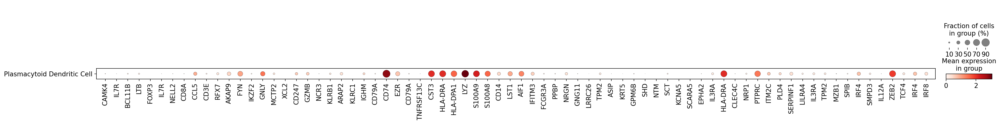

In [110]:
sc.pl.dotplot(adata_pDC,marker_genes, groupby='annotation_AZ',dendrogram=False, use_raw=True)

In [111]:
adata_pDC = adata_filtered[adata_filtered.obs["annotation_AZ"] == "Plasmacytoid Dendritic Cell"]

#adata_pDC.obs.insert(13, 'indicator', range(1, 1 + len(adata_pDC.obs)))
#adata_pDC.obs["indicator"]=pd.Categorical(adata_pDC.obs.indicator)

In [ ]:
adata_pDC.obs
#donor
#Visualize the clusters with umap 
rcParams['figure.figsize']=(10,10)
fig_ind=np.arange(131, 133)
fig = plt.figure()
fig.subplots_adjust(hspace=0.4, wspace=0.6)

sc.pl.umap(adata_pDC, color=["donor","n_genes_by_counts","leiden",'CAMK4','IL7R','BCL11B', 'LTB','FOXP3','IL7R','NELL2','CD8A','CCL5','CD3E','RFX7','AKAP9','FYN',
              'IKZF2','GNLY', 'MCTP2','XCL2', 'CD247','GZMB','NCR3','KLRB1','ARAP2','KLRC1',
                'IGHM','CD79A','CD74','EZR','CD79A','TNFRSF13C','CST3','HLA-DRA','HLA-DPA1','LYZ','S100A9', 'S100A8','CD14',
                'LST1', 'AIF1','IFITM3','FCGR3A','PPBP','NRGN','GNG11',"LRRC26","TPM2","ASIP","KRT5","GPM6B","SHD","NTM","SCT",
                "KCNA5","SCARA5","EPHA2","IL3RA","HLA-DRA","CLEC4C","NRP1","PTPRC","ITM2C", "PLD4", "SERPINF1", "LILRA4", "IL3RA", "TPM2",
                                       "MZB1", "SPIB", "IRF4", "SMPD3","IL12A","ZEB2","TCF4","IRF4","IRF8"],edgecolor='none', size=60, show=True, linewidths=10,legend_fontsize = "x-small")

{'mainplot_ax': <AxesSubplot:>,
 'color_legend_ax': <AxesSubplot:title={'center':'Median expression\nin group'}>}

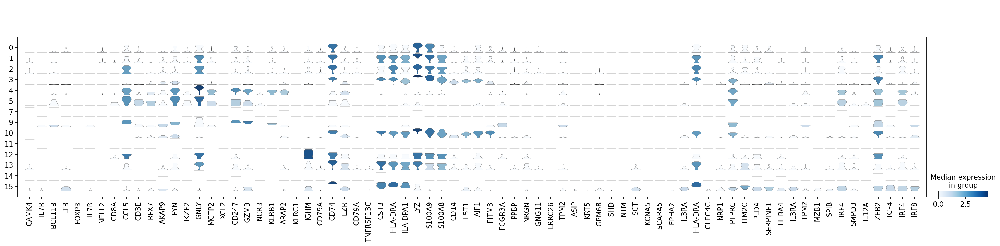

In [115]:

sc.pl.stacked_violin(adata_pDC, marker_genes, groupby='leiden',use_raw=True, show=False)


In [117]:
adata_pDC_cluster16 = adata_pDC[adata_pDC.obs["leiden"] == "15"]

adata_pDC_cluster16.obs.insert(13, 'indicator', range(1, 1 + len(adata_pDC_cluster16.obs)))
adata_pDC_cluster16.obs["indicator"]=pd.Categorical(adata_pDC_cluster16.obs.indicator)

In [119]:
#adata_pDC.obs
#donor
#Visualize the clusters with umap 
rcParams['figure.figsize']=(10,10)
fig_ind=np.arange(131, 133)
fig = plt.figure()
fig.subplots_adjust(hspace=0.4, wspace=0.6)

#sc.pl.umap(adata_pDC_cluster16, color=["indicator","donor","n_genes_by_counts","leiden",'CAMK4','IL7R','BCL11B', 'LTB','FOXP3','IL7R','NELL2','CD8A','CCL5','CD3E','RFX7','AKAP9','FYN',
#              'IKZF2','GNLY', 'MCTP2','XCL2', 'CD247','GZMB','NCR3','KLRB1','ARAP2','KLRC1',
#                'IGHM','CD79A','CD74','EZR','CD79A','TNFRSF13C','CST3','HLA-DRA','HLA-DPA1','LYZ','S100A9', 'S100A8','CD14',
#                'LST1', 'AIF1','IFITM3','FCGR3A','PPBP','NRGN','GNG11',"LRRC26","TPM2","ASIP","KRT5","GPM6B","SHD","NTM","SCT",
#                "KCNA5","SCARA5","EPHA2","IL3RA","HLA-DRA","CLEC4C","NRP1","PTPRC","ITM2C", "PLD4", "SERPINF1", "LILRA4", "IL3RA", "TPM2",
#                                       "MZB1", "SPIB", "IRF4", "SMPD3","IL12A","ZEB2","TCF4","IRF4","IRF8"],edgecolor='none', size=60, show=True, linewidths=10,legend_fontsize = "x-small",save="plot.pdf")

<Figure size 800x800 with 0 Axes>

{'mainplot_ax': <AxesSubplot:>,
 'color_legend_ax': <AxesSubplot:title={'center':'Median expression\nin group'}>}

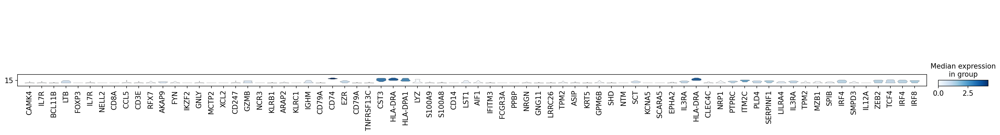

In [120]:

sc.pl.stacked_violin(adata_pDC_cluster16, marker_genes, groupby='leiden',use_raw=True, show=False)


In [121]:
#adata_filtered.write(results_file)

In [123]:
##############################################################################################################################################################################

In [132]:
newlist_pDCs = [adata_pDC_cluster16, adata_doublet_pDC_cluster_16]
adata_pDCs_goods_and_doublets_cluster_16 = anndata.concat(newlist_pDCs)

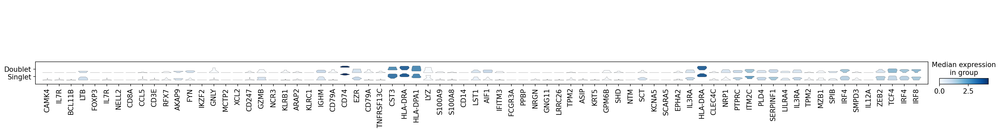

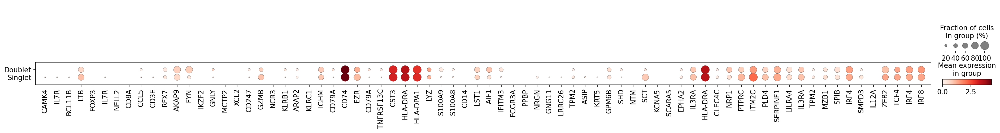

In [125]:
sc.pl.stacked_violin(adata_pDCs_goods_and_doublets_cluster_16, marker_genes, groupby='doublets',use_raw=True, show=False)
sc.pl.dotplot(adata_pDCs_goods_and_doublets_cluster_16,marker_genes, groupby='doublets',dendrogram=False, use_raw=True)


In [126]:
##############################################################################################################################################################################

In [133]:
adata_filtered = adata_filtered[adata_filtered.obs["annotation_AZ"] != "Plasmacytoid Dendritic Cell"]

In [134]:
newlist_final=[adata_filtered,adata_pDCs_goods_and_doublets_cluster_16]
adata_filtered_plus_good_pDCs = anndata.concat(newlist_final)

In [131]:
#cells= adata.obs.index
#cells = pd.DataFrame(adata_filtered.obs.index)
#cells.to_csv("cells.csv")

In [ ]:
#adata_filtered_plus_good_pDCs.write(results_file)